In [1]:
# importing libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.datasets import load_iris
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn import preprocessing
from sklearn.tree import DecisionTreeClassifier

# for visualisation
import matplotlib.pyplot as plt
get_ipython().run_line_magic('matplotlib', 'inline')
from sklearn.tree import export_graphviz
from IPython.display import Image  
import missingno
from subprocess import call


In [2]:
data = pd.read_csv("titanic.csv")
data.tail(100)

,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
791,792,0,2,"Gaskell, Mr. Alfred",male,16.0,0,0,239865,26.0000,NaN,S
792,793,0,3,"Sage, Miss. Stella Anna",female,NaN,8,2,CA. 2343,69.5500,NaN,S
793,794,0,1,"Hoyt, Mr. William Fisher",male,NaN,0,0,PC 17600,30.6958,NaN,C
794,795,0,3,"Dantcheff, Mr. Ristiu",male,25.0,0,0,349203,7.8958,NaN,S
795,796,0,2,"Otter, Mr. Richard",male,39.0,0,0,28213,13.0000,NaN,S
...,...,...,...,...,...,...,...,...,...,...,...,...
886,887,0,2,"Montvila, Rev. Juozas",male,27.0,0,0,211536,13.0000,NaN,S
887,888,1,1,"Graham, Miss. Margaret Edith",female,19.0,0,0,112053,30.0000,B42,S
888,889,0,3,"Johnston, Miss. Catherine Helen ""Carrie""",female,NaN,1,2,W./C. 6607,23.4500,NaN,S
889,890,1,1,"Behr, Mr. Karl Howell",male,26.0,0,0,111369,30.0000,C148,C


<AxesSubplot:>

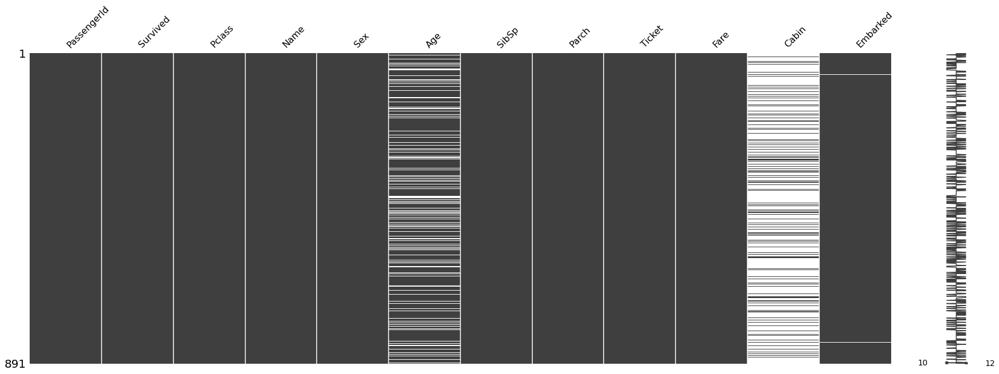

In [3]:
# Plot graphic of missing values
missingno.matrix(data, figsize = (30,10))

In [4]:
#Remove records with missing data on the 'Embarked' and 'Age' column
data = data.dropna(axis=0, subset=['Embarked', 'Age'])

In [5]:
# The olumn SibSp and Parch can be combined and reduced to whether the person has family on board. We can then further investigate
# if having family increases the chances of survival
data['Family'] =  data["Parch"] + data["SibSp"]
data['Family'].loc[data['Family'] > 0] = 1
data['Family'].loc[data['Family'] == 0] = 0

C:\Users\user\AppData\Local\Temp\ipykernel_12020\1559519070.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['Family'].loc[data['Family'] > 0] = 1
C:\Users\user\AppData\Local\Temp\ipykernel_12020\1559519070.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['Family'].loc[data['Family'] == 0] = 0


### Preprocessing

In [6]:
#Binary column of 1 for male and 0 for female
data['Sex_bin'] = np.where(data['Sex'].str.contains('female'), 0, 1)

In [7]:
#Replacing Embarked categories with values
replace_map = {'Embarked': {'S':1, 'C':2, 'Q': 3}}
labels = data['Embarked'].astype('category').cat.categories.tolist()
data.replace(replace_map, inplace = True)

In [8]:
#Dropping cabin column from dataframe
data.drop(['Cabin', 'Name', 'SibSp', 'Parch', 'Ticket', 'Sex', 'PassengerId'],axis=1, inplace=True)

In [9]:
#Assining dependant and independant variables
X = data.iloc[:, [1,2,3,4,5,6]].values
y = data.iloc[:,0].values

X = X.reshape(-1, 6)
X = preprocessing.scale(X) #scale the data so that it is easier to fit

In [10]:
#splitting the data into a training,development, and test set.
train_ratio = 0.80
test_ratio = 0.10
dev_ratio = 0.10

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=test_ratio)

X_train, X_dev, y_train, y_dev = train_test_split(X_train, y_train, test_size=dev_ratio/(train_ratio+test_ratio))

print(X_train.shape)
print(X_test.shape)
print(X_dev.shape)

(568, 6)
(72, 6)
(72, 6)


### Training 

In [11]:
# training a model without pruning
unpruned = DecisionTreeClassifier(max_depth=None, random_state=4)
unpruned.fit(X_train, y_train)
unpruned_depths = unpruned.tree_.max_depth

In [12]:
graphviz_installed = True
names = list(data.iloc[:,1:].columns.values)

if (graphviz_installed):
    export_graphviz(unpruned, out_file='unpruned_tree.dot', feature_names = names,
                  rounded = True, proportion = False, precision = 2, filled = True)
  
  # Convert to png using system command
    call(['dot', '-Tpng', 'unpruned_tree.dot', '-o','unpruned_tree.png', '-Gdpi=600'])
  
else: 
    fig = plt.figure()
    tree.plot_tree(unpruned,feature_names = iris.feature_names, 
                     rounded = True, proportion = False, precision = 2, filled = True) #display tree
    fig.savefig('upruned_tree.png')
  
Image(filename = 'unpruned_tree.png', width=400) #uncomment if using graphviz

In [13]:
#Accuracy on development set
unpruned = DecisionTreeClassifier(max_depth=None, random_state=4)
unpruned.fit(X_train, y_train)
unpruned_depths = unpruned.tree_.max_depth
print("Performance without pruning:", unpruned.score(X_dev, y_dev))
print("At depth:", unpruned_depths)

Performance without pruning: 0.75
At depth: 22


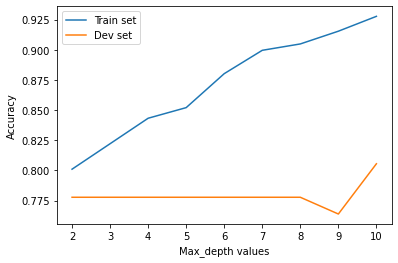

In [14]:
# looking at effect of pruning   
unpruned_depths = range(2,10+1)
r = 4

unpruned_scores = [] 
for d in unpruned_depths:
    clf = DecisionTreeClassifier(max_depth=d, random_state=r)
    clf.fit(X_train, y_train)
    score = clf.score(X_train, y_train)                   
    unpruned_scores.append(score)

unpruned_scores1 = []     
for d in unpruned_depths:
    clf = DecisionTreeClassifier(max_depth=d, random_state=r)
    clf.fit(X_train, y_train)
    score = clf.score(X_dev, y_dev)                   
    unpruned_scores1.append(score)

# Plot of  dev and development accuracies accuracies
fig, ax = plt.subplots()
ax.plot(unpruned_depths, unpruned_scores, label = 'Train set')
ax.plot(unpruned_depths, unpruned_scores1, label = 'Dev set')
plt.xlabel("Max_depth values")
plt.ylabel("Accuracy")
ax.xaxis.set_ticks(unpruned_depths)
plt.legend(loc=2)
plt.show()

 For the train set we see a linear graph and for the dev set we see a rather complex trend

### Pruning 

In [15]:
# Choosing optimum depth
best_depth = unpruned_depths[np.argmax(unpruned_scores1)]
print('Best performance reached at depth of:', best_depth)

Best performance reached at depth of: 10


In [16]:
# training a model without pruning
pruned = DecisionTreeClassifier(max_depth=best_depth, random_state=4)
pruned.fit(X_train, y_train)


DecisionTreeClassifier(max_depth=10, random_state=4)

In [17]:
#prediction
y_pred = pruned.predict(X_test) #Accuracy
print("Performance with pruning:", pruned.score(X_test, y_test))
print("At depth:", best_depth)

Performance with pruning: 0.7916666666666666
At depth: 10


The program perfomed exceptionally and with great accuracy

# TASK 07

In [18]:
# import packages 
import pandas as pd

from sklearn.datasets import make_classification
from sklearn.metrics import accuracy_score

from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import BaggingClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import AdaBoostClassifier

## Bagging

In [19]:
# Create base model
base = DecisionTreeClassifier(max_depth=best_depth)
ensemble = BaggingClassifier(base_estimator=base, n_estimators=100, random_state=4)

#Fitting to get baseline results
base.fit(X_train,y_train)
ensemble.fit(X_train,y_train)

# training a model without pruning
unpruned_depths = base.tree_.max_depth
print("At depth:", unpruned_depths)

print("Accuracy base:",base.score(X_test, y_test))
print("Accuracy bagging_classifier:",ensemble.score(X_test, y_test))

At depth: 10
Accuracy base: 0.7638888888888888
Accuracy bagging_classifier: 0.8055555555555556


## Random forrest

In [20]:
# Import the model we are using
from sklearn.ensemble import RandomForestRegressor

forest = RandomForestClassifier(n_estimators=100, random_state=4)
forest.fit(X_train, y_train)

print("Accuracy base:",base.score(X_test, y_test))
print("Accuracy of random_forest:",forest.score(X_test, y_test))

Accuracy base: 0.7638888888888888
Accuracy of random_forest: 0.8333333333333334


### Importance scores

In [21]:
feature_imp = pd.Series(forest.feature_importances_).sort_values(ascending=False)
feature_imp

1    0.318436
2    0.284417
5    0.241198
0    0.101348
3    0.034027
4    0.020575
dtype: float64

We note the Pclass is the most important feauture

## Boosting

In [22]:
from sklearn.ensemble import AdaBoostClassifier

AdaBoost = AdaBoostClassifier(base_estimator= pruned,n_estimators=10,learning_rate=1)
AdaBoost.fit(X_train,y_train)
print("Accuracy base:",pruned.score(X_test, y_test))
print("Accuracy of BoostClassifier:",AdaBoost.score(X_test, y_test))

Accuracy base: 0.7916666666666666
Accuracy of BoostClassifier: 0.7361111111111112


## Chosen Method : Random Forrest

In [23]:
#Tweaking n-estimator
forest = RandomForestClassifier(n_estimators=400, random_state=4)
forest.fit(X_train, y_train)

print("Accuracy base:",base.score(X_test, y_test))
print("Accuracy of random_forest:",forest.score(X_test, y_test))
print('The optimum value of n-estimattors is found to be between 250-400')
print('At a max-depth :', best_depth) 

Accuracy base: 0.7638888888888888
Accuracy of random_forest: 0.8333333333333334
The optimum value of n-estimattors is found to be between 250-400
At a max-depth : 10
